In [1]:
!pip install keras==2.12.0

In [2]:
import tensorflow as tf
from tensorflow import keras
from keras import Sequential
from keras.layers import Dense,Conv2D,MaxPooling2D,Flatten

In [3]:
# internally it is using genrator concept which is there in python

train_ds=keras.utils.image_dataset_from_directory(
    directory=r'C:\Q\archive\dogs_vs_cats\train',
    batch_size=32,
    image_size=(256,256),
    labels="inferred",
    label_mode="int"
    
)

validation_ds=keras.utils.image_dataset_from_directory(
    directory=r'C:\Q\archive\dogs_vs_cats\test',
    batch_size=32,
    image_size=(256,256),
    labels="inferred",
    label_mode="int"

    
)

Found 20000 files belonging to 2 classes.
Found 5000 files belonging to 2 classes.


In [4]:
for i in train_ds:
    print(i)

(<tf.Tensor: shape=(32, 256, 256, 3), dtype=float32, numpy=
array([[[[178.5039   , 176.5039   , 177.5039   ],
         [181.1211   , 179.1211   , 180.1211   ],
         [176.78516  , 175.78516  , 173.78516  ],
         ...,
         [204.18573  , 200.33417  , 203.95135  ],
         [210.22266  , 200.08203  , 205.65234  ],
         [211.59532  , 200.59532  , 206.59532  ]],

        [[182.43164  , 180.43164  , 181.43164  ],
         [185.04883  , 183.04883  , 184.04883  ],
         [180.39662  , 179.39662  , 177.39662  ],
         ...,
         [213.49274  , 209.64117  , 213.25836  ],
         [215.98384  , 207.85056  , 212.5947   ],
         [220.35156  , 211.0039   , 216.17773  ]],

        [[185.33008  , 183.33008  , 184.33008  ],
         [186.7853   , 184.7853   , 185.7853   ],
         [181.85156  , 180.85156  , 178.85156  ],
         ...,
         [218.08421  , 214.23265  , 217.84984  ],
         [213.82994  , 206.76395  , 211.11928  ],
         [221.72075  , 213.85161  , 218.4746

In [4]:
# Normalize
def process(image,label):
    image = tf.cast(image/255. ,tf.float32)
    return image,label

train_ds = train_ds.map(process)
validation_ds = validation_ds.map(process)

In [6]:
# if i want to fast process# if i want to fast process

In [5]:
model=Sequential()

In [6]:
# this is my first convolution layer
model.add(Conv2D(32,kernel_size=(3,3),padding='valid',activation='relu',input_shape=(256,256,3)))
model.add(MaxPooling2D(pool_size=(2,2),strides=2,padding='valid'))

#second convolution
model.add(Conv2D(64,kernel_size=(3,3),padding='valid',activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2),strides=2,padding='valid'))

#third convlolution
model.add(Conv2D(128,kernel_size=(3,3),padding='valid',activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2),strides=2,padding='valid'))

#convert the data into 1-d array
model.add(Flatten())

#adding first hidden layer with 128 neurons and realu activation
model.add(Dense(128,activation='relu'))
#adding second hidden layer with 64 neurons and relu activation
model.add(Dense(64,activation='relu'))
#here we have a 1 output since it is a binary classification
model.add(Dense(1,activation='sigmoid'))


In [7]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 127, 127, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 62, 62, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 60, 60, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 30, 30, 128)      0

In [8]:
model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])

In [9]:
model.fit(train_ds,epochs=2,validation_data=validation_ds)

Epoch 1/2
625/625 [==============================] - 1090s 2s/step - loss: 0.5953 - accuracy: 0.6734 - val_loss: 0.5188 - val_accuracy: 0.7582
Epoch 2/2
625/625 [==============================] - 1082s 2s/step - loss: 0.4686 - accuracy: 0.7721 - val_loss: 0.4724 - val_accuracy: 0.7714


In [10]:

import matplotlib.pyplot as plt

In [11]:
dog_image=plt.imread(r"C:\Users\User\Downloads\download.jpeg")

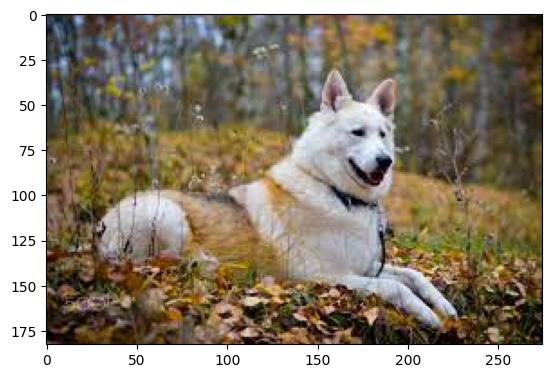

In [12]:
plt.imshow(dog_image)

In [13]:
cat_image=plt.imread(r"C:\Users\User\Downloads\cat.jpeg")

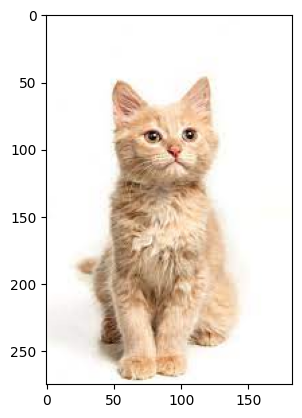

In [14]:
plt.imshow(cat_image)

In [15]:
dog_image.shape

(183, 275, 3)

In [16]:
cat_image.shape

(275, 183, 3)

In [17]:
pip install opencv-python

Note: you may need to restart the kernel to use updated packages.


In [18]:
import cv2
dog_resize=cv2.resize(dog_image,(256,256))
cat_resize=cv2.resize(cat_image,(256,256))

In [19]:
dog_resize.shape

(256, 256, 3)

In [20]:
cat_resize.shape

(256, 256, 3)

In [21]:

dog_resize=dog_resize.reshape((1,256,256,3))

In [22]:

dog_resize.shape

(1, 256, 256, 3)

In [23]:

cat_resize=cat_resize.reshape((1,256,256,3))

In [24]:

pred=model.predict(dog_resize)

1/1 [==============================] - 0s 148ms/step


In [25]:
c=model.predict(cat_resize)

1/1 [==============================] - 0s 40ms/step


In [26]:

if pred==0:
    print("this is a image of cat")
else:
    print("this is a image of dog")

this is a image of dog


In [27]:
if c==1:
    print("this is a image of cat")
else:
    print("this is a image of dog")

this is a image of cat


In [31]:
# father mother sis bro yours grand father/mother

In [32]:
# 100 pictures

In [42]:
def imagepred(imz):
    cat_image=imz
    cat_resize=cv2.resize(cat_image,(256,256))
    cat_resize=cat_resize.reshape((1,256,256,3))
    model.predict(cat_resize)
    if pred==0:
        print("this is a image of cat")
    else:
        print("this is a image of dog")
    return

In [43]:
cat_image=plt.imread(r"C:\Users\User\Downloads\cat.jpeg")
#print(y)
imagepred(cat_image)

1/1 [==============================] - 0s 76ms/step
this is a image of dog
